# 과제 개요
- instance segmentation 패키지 설정
  - exploration 수업 자료에서 제시한 pixellib는 너무 오래된 패키지라 코랩에 설치된 패키지 버전과 많이 다름.
  - 코랩에서 패키지 버전을 맞추는데 노력이 많이 들어서 그냥 메타에서 배포한 detectron2를 사용함.
  - detectron2의 instance segmentation 모델 중 여러가지를 선택하여 사용함.
- 중간 부분에 함수 진행 과정에 대한 설명을 하고 마지막 부분에 그 내용을 함수화하여 반복적으로 보여줌.
- 이후에 과제 루브릭 기준에 대한 설명 추가

# Detectron2 패키지 설치

In [1]:
# install dependencies: 
!pip install pyyaml==5.1
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 4.1 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=a35a18f8152d46efd119bd6f4262bb4323851eacd0a12ed10fc4c3a64d0f13e8
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
1.11.0+cu113 True


In [ ]:
# clone the repo in order to access pre-defined configs in PointRend project
!git clone --branch v0.6 https://github.com/facebookresearch/detectron2.git detectron2_repo
# install detectron2 from source
!pip install -e detectron2_repo
# See https://detectron2.readthedocs.io/tutorials/install.html for other installation options

# 데이터 준비(여기까지 실행 후 런타임 재시작)

In [1]:
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [2]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import matplotlib.pyplot as plt
import cv2
import torch
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog
coco_metadata = MetadataCatalog.get("coco_2017_val")

# import PointRend project
from detectron2.projects import point_rend

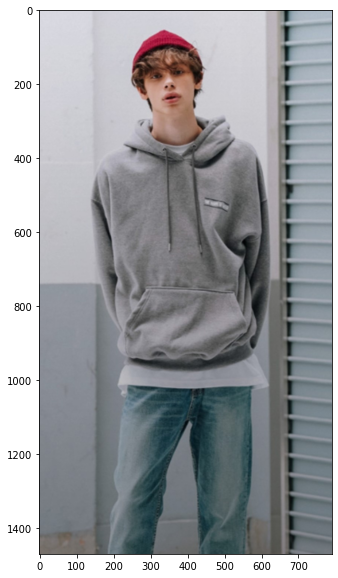

In [ ]:
img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/my_image.jpg'
original_img = cv2.imread(img_path) 

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))

In [ ]:
cfg = get_cfg()
# Add PointRend-specific config
point_rend.add_pointrend_config(cfg)
# Load a config from file
cfg.merge_from_file("detectron2_repo/projects/PointRend/configs/InstanceSegmentation/pointrend_rcnn_R_50_FPN_3x_coco.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Use a model from PointRend model zoo: https://github.com/facebookresearch/detectron2/tree/master/projects/PointRend#pretrained-models
cfg.MODEL.WEIGHTS = "detectron2://PointRend/InstanceSegmentation/pointrend_rcnn_R_50_FPN_3x_coco/164955410/model_final_edd263.pkl"
predictor = DefaultPredictor(cfg)
outputs = predictor(original_img)

model_final_edd263.pkl: 241MB [00:23, 10.1MB/s]                           


WARNING [06/09 01:46:37 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/content/detectron2_repo/projects/PointRend/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It curren

In [ ]:
predictor = DefaultPredictor(cfg)
outputs = predictor(original_img)

WARNING [06/09 01:46:38 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/content/detectron2_repo/projects/PointRend/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  point_coords[:, :, 1] = h_step / 2.0 + (point

In [ ]:
viz = Visualizer(original_img[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
output = viz.draw_instance_predictions(outputs["instances"].to("cpu"))

# instance segmentation 결과

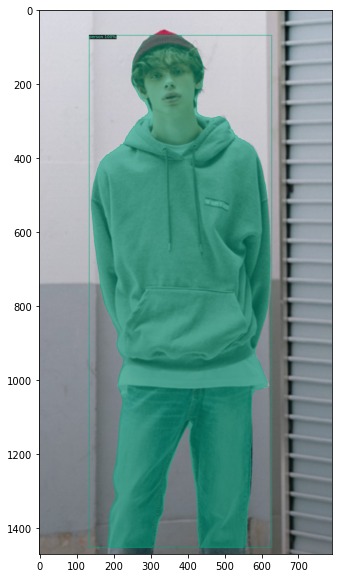

In [ ]:
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(output.get_image()[:,:,::-1], cv2.COLOR_BGR2RGB))

# 마스크 분리

In [ ]:
outputs

{'instances': Instances(num_instances=1, image_height=1470, image_width=790, fields=[pred_boxes: Boxes(tensor([[ 135.3095,   68.0278,  627.2831, 1451.9714]], device='cuda:0')), scores: tensor([0.9986], device='cuda:0'), pred_classes: tensor([0], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]]], device='cuda:0')])}

- point rend의 출력 결과물에는 다음과 같은 데이터들이 포함되며 이중 마스크 관련 변수만 가져오겠음.
- num_instances : 인스턴스 개수
- image_height : 이미지 높이
- image_width : 이미지 폭
- fields : 이미지 경계 좌표
- scores : 클래스 예측 확률
- pred_classes : 예측한 클래스 인덱스
- pred_masks : 마스크 좌표

In [ ]:
mask = outputs["instances"].pred_masks
mask

tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]], device='cuda:0')

In [ ]:
mask.shape

torch.Size([1, 1470, 790])

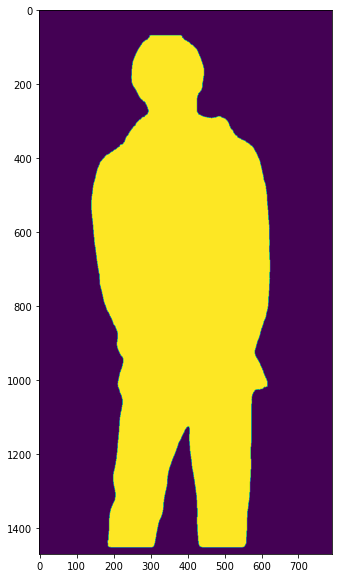

In [ ]:
mask = np.array(mask.to("cpu").squeeze()) # 이미지를 plot하기 위해 3차원 이미지 데이터 중 쓸모없는 1을 squeeze 함수로 날려버림.

plt.figure(figsize=(20, 10))
plt.imshow(mask)

In [ ]:
mask = np.where(mask, 1, 0)
mask = mask.astype(np.uint8) * 255

- True, False를 255, 0으로 변환

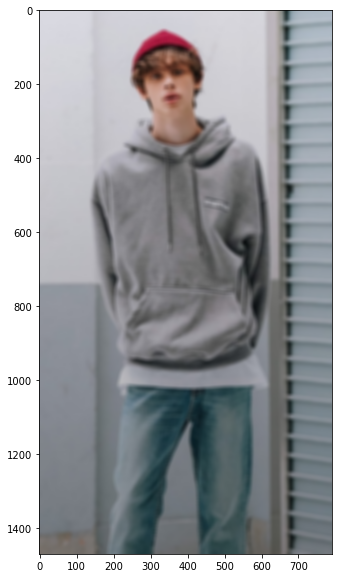

In [ ]:
# (13,13)은 blurring kernel size를 뜻합니다
# 다양하게 바꿔보세요
img_orig_blur = cv2.blur(original_img, (13,13))  

plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

- 이미지를 블러 처리함.

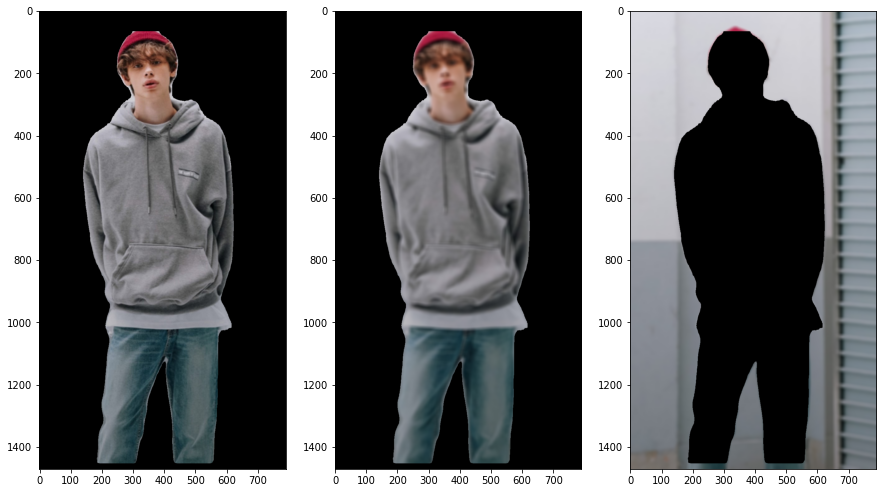

In [ ]:
color_mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR) # 1차원 필터를 3개 복사하여 3차원으로 변경해 줌.
inversion_color_mask = cv2.bitwise_not(color_mask) # 마스크 반전

# 원본 사진을 인물만 살린 이미지 생성
original_human_img = cv2.bitwise_and(original_img, color_mask)
# 블러처리한 사진을 인물만 살린 이미지 생성
blured_human_img = cv2.bitwise_and(img_orig_blur, color_mask)
# 블러처리한 사진을 배경만 살린 이미지 생성
blured_background_img = cv2.bitwise_and(img_orig_blur, inversion_color_mask)

# 시각화
plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original_human_img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(blured_human_img, cv2.COLOR_BGR2RGB))

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(blured_background_img, cv2.COLOR_BGR2RGB))
plt.show()

- 원본 인물 이미지 / 블러처리한 이미지를 배경과 인물로 분리함.

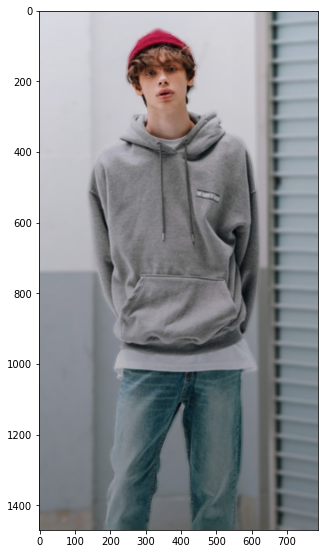

In [ ]:
# np.where 함수를 이용하여 마스크가 있는 좌표에 기존 인물 이미지 / 아닌 좌표에 블러처리한 배경 이미지를 삽입
img_concat = np.where(color_mask==255, original_human_img, blured_background_img)

# 시각화
plt.figure(figsize=(5, 10))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

- 최종적으로 배경을 블러 처리한 이미지를 생성.

# 여러 이미지에 대한 반복작업 수행
- blured_background 함수
  - 객체를 제외한 배경 흐리게 만들기
  - mask rcnn, point rend 모델 사용
- blend_background 함수
  - 객체와 배경을 합성하기
  - mask rcnn, point rend 모델 사용

In [ ]:
def blured_background(original_img, model):
    # 모델 선정--------------------------------------------------------------------------------------------------------------------------------------
    # pointrend 모델 사용
    if model == "point_rend":
        cfg = get_cfg()
        point_rend.add_pointrend_config(cfg)
        cfg.merge_from_file("detectron2_repo/projects/PointRend/configs/InstanceSegmentation/pointrend_rcnn_R_50_FPN_3x_coco.yaml")
        cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
        cfg.MODEL.WEIGHTS = "detectron2://PointRend/InstanceSegmentation/pointrend_rcnn_R_50_FPN_3x_coco/164955410/model_final_edd263.pkl"
        predictor = DefaultPredictor(cfg)
        outputs = predictor(original_img)
        
    # mask RCNN 모델 사용
    elif model == "mask_rcnn":
        cfg = get_cfg()
        cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))
        cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
        cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")
        predictor = DefaultPredictor(cfg)
        outputs = predictor(original_img)
    


    # 원본 및 배경 이미지 시각화 -------------------------------------------------------------------------------------------------------------------------
    plt.figure(figsize=(15, 8))
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.show()



    # 객체 검출 이미지 및 마스크 시각화  -------------------------------------------------------------------------------------------------------------------
    # 객체 검출
    viz = Visualizer(original_img[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(outputs["instances"].to("cpu"))

    # 마스크 분리
    for i, class_index in enumerate(outputs["instances"].pred_classes):
        # 여러 객체 중 마스크가 사람이나 고양이인 경우만 마스크에 저장
        # 사람 : 0
        # 고양이 : 15
        if (class_index == 0) or (class_index == 15):
            mask = outputs["instances"].pred_masks
            mask = mask[i]
            mask = np.array(mask.to("cpu").squeeze()) # 이미지를 plot하기 위해 3차원 이미지 데이터 중 쓸모없는 1을 squeeze 함수로 날려버림.
            mask = np.where(mask, 1, 0) # True/False를 1/0으로 변환
            mask = mask.astype(np.uint8) * 255 # 색상을 표현하기 위해 uint8 타입으로 변환 후 1 -> 255로 변환

    # 시각화
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(output.get_image()[:,:,::-1], cv2.COLOR_BGR2RGB))
    plt.title("Instance Segmentation")
    plt.subplot(1, 2, 2)
    plt.imshow(mask)
    plt.title("Mask")
    plt.show()



    # 이미지 블러링 시각화  --------------------------------------------------------------------------------------------------------------------------------
    # 이미지 블러링
    # (13,13) : blurring kernel size
    blured_original_img = cv2.blur(original_img, (13,13))  

    # 3차원 마스크 및 반전 마스크 생성
    color_mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR) # 1차원 필터를 3개 복사하여 3차원으로 변경해 줌.
    inversion_color_mask = cv2.bitwise_not(color_mask) # 마스크 반전

    # 원본 사진을 인물만 살린 이미지 생성
    original_instance_img = cv2.bitwise_and(original_img, color_mask)
    # 블러처리한 사진을 인물만 살린 이미지 생성
    blured_instance_img = cv2.bitwise_and(blured_original_img, color_mask)
    # 블러처리한 사진을 배경만 살린 이미지 생성
    blured_background_img = cv2.bitwise_and(blured_original_img, inversion_color_mask)
    # np.where 함수를 이용하여 마스크가 있는 좌표에 기존 인물 이미지 / 아닌 좌표에 블러처리한 배경 이미지를 삽입
    img_concat = np.where(color_mask==255, original_instance_img, blured_background_img)

    # 블러링 된 원본 이미지 시각화
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(blured_original_img, cv2.COLOR_BGR2RGB))
    plt.title("Blured Instance")
    plt.show()

    # 이미지 처리 과정 시각화
    plt.figure(figsize=(20, 8))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original_instance_img, cv2.COLOR_BGR2RGB))
    plt.title("Instance - Background")
    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(blured_instance_img, cv2.COLOR_BGR2RGB))
    plt.title("Blured Instance - Background")
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(blured_background_img, cv2.COLOR_BGR2RGB))
    plt.title("Blured Background - Instance")
    plt.show()

    # 결과물 시각화
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
    plt.title("Instance + Blured Background")
    plt.show()

In [ ]:
def blend_background(original_img, background_img, model):
    # 모델 선정--------------------------------------------------------------------------------------------------------------------------------------
    # pointrend 모델 사용
    if model == "point_rend":
        cfg = get_cfg()
        point_rend.add_pointrend_config(cfg)
        cfg.merge_from_file("detectron2_repo/projects/PointRend/configs/InstanceSegmentation/pointrend_rcnn_R_50_FPN_3x_coco.yaml")
        cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # set threshold for this model
        cfg.MODEL.WEIGHTS = "detectron2://PointRend/InstanceSegmentation/pointrend_rcnn_R_50_FPN_3x_coco/164955410/model_final_edd263.pkl"
        predictor = DefaultPredictor(cfg)
        outputs = predictor(original_img)
        
    # mask RCNN 모델 사용
    elif model == "mask_rcnn":
        cfg = get_cfg()
        cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"))
        cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
        cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml")
        predictor = DefaultPredictor(cfg)
        outputs = predictor(original_img)
    


    # 원본 및 배경 이미지 시각화 -------------------------------------------------------------------------------------------------------------------------
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(background_img, cv2.COLOR_BGR2RGB))
    plt.title("Background Image")
    plt.show()


    # 원본 및 배경 이미지 크기 조정 후 재시각화 -----------------------------------------------------------------------------------------------------------
    # 배경 이미지의 크기를 객체가 담긴 이미지에 맞춤
    background_img = cv2.resize(background_img, (original_img.shape[1], original_img.shape[0]))
    
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(background_img, cv2.COLOR_BGR2RGB))
    plt.title("Reshaped Background Image")
    plt.show()



    # 객체 검출 이미지 및 마스크 시각화  -------------------------------------------------------------------------------------------------------------------
    # 객체 검출
    viz = Visualizer(original_img[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
    output = viz.draw_instance_predictions(outputs["instances"].to("cpu"))

    # 마스크 분리
    for i, class_index in enumerate(outputs["instances"].pred_classes):
        # 여러 객체 중 마스크가 사람이나 고양이인 경우만 마스크에 저장
        # 사람 : 0
        # 고양이 : 15
        if (class_index == 0) or (class_index == 15):
            mask = outputs["instances"].pred_masks
            mask = mask[i]
            mask = np.array(mask.to("cpu").squeeze()) # 이미지를 plot하기 위해 3차원 이미지 데이터 중 쓸모없는 1을 squeeze 함수로 날려버림.
            mask = np.where(mask, 1, 0) # True/False를 1/0으로 변환
            mask = mask.astype(np.uint8) * 255 # 색상을 표현하기 위해 uint8 타입으로 변환 후 1 -> 255로 변환

    # 시각화
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(output.get_image()[:,:,::-1], cv2.COLOR_BGR2RGB))
    plt.title("Instance Segmentation")
    plt.subplot(1, 2, 2)
    plt.imshow(mask)
    plt.title("Mask")
    plt.show()



    # 이미지 합성 시각화  --------------------------------------------------------------------------------------------------------------------------------
    # 3차원 마스크 및 반전 마스크 생성
    color_mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR) # 1차원 필터를 3개 복사하여 3차원으로 변경해 줌.
    inversion_color_mask = cv2.bitwise_not(color_mask) # 마스크 반전

    # 원본 사진을 객체만 살린 이미지 생성
    original_instance_img = cv2.bitwise_and(original_img, color_mask)
    # 배경 사진에서 원본 객체를 제거한 이미지 생성
    instance_removed_background_img = cv2.bitwise_and(background_img, inversion_color_mask)
    # np.where 함수를 이용하여 마스크가 있는 좌표에 기존 객체 이미지 / 아닌 좌표에 배경 이미지를 삽입
    img_concat = np.where(color_mask==255, original_instance_img, instance_removed_background_img)

    # 이미지 처리 과정 및 결과 시각화
    plt.figure(figsize=(20, 8))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original_instance_img, cv2.COLOR_BGR2RGB))
    plt.title("Instance - Background")
    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(instance_removed_background_img, cv2.COLOR_BGR2RGB))
    plt.title("Background - Instance")
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
    plt.title("Instance + Background")
    plt.show()

# 사람1 mask rcnn

/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


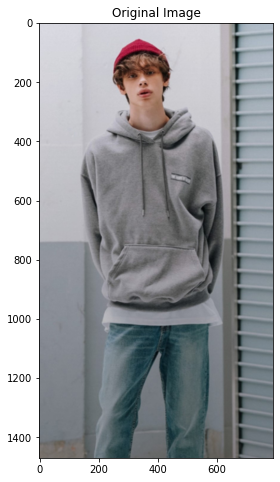

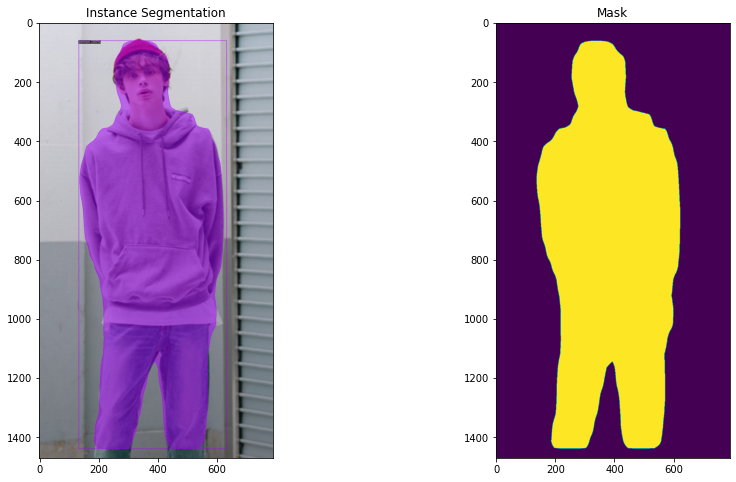

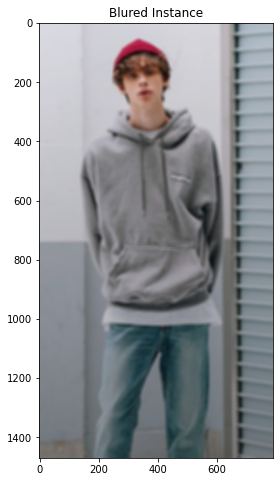

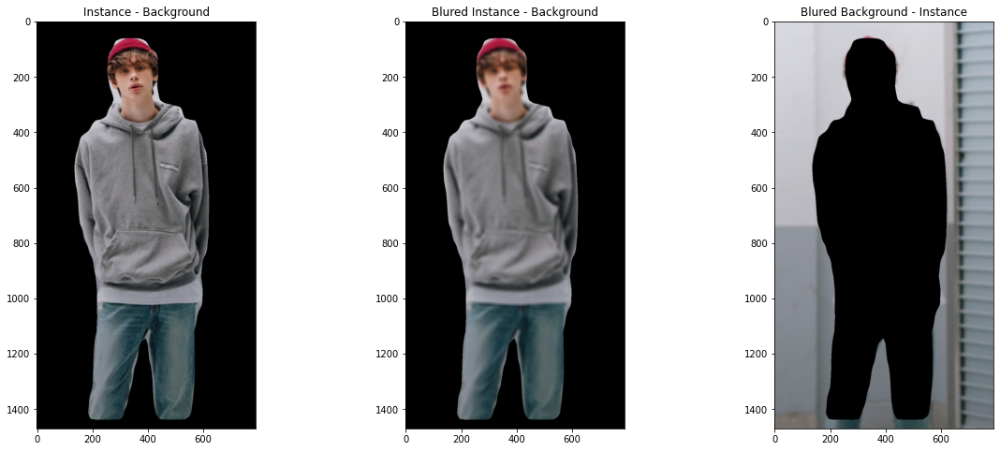

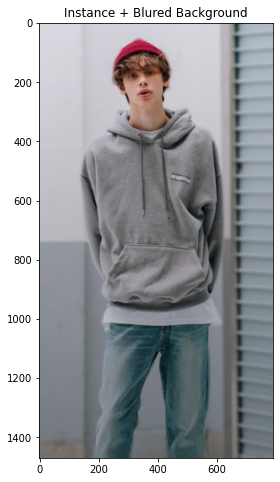

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/my_image.jpg'
original_img = cv2.imread(original_img_path)

blured_background(original_img, model='mask_rcnn')

/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


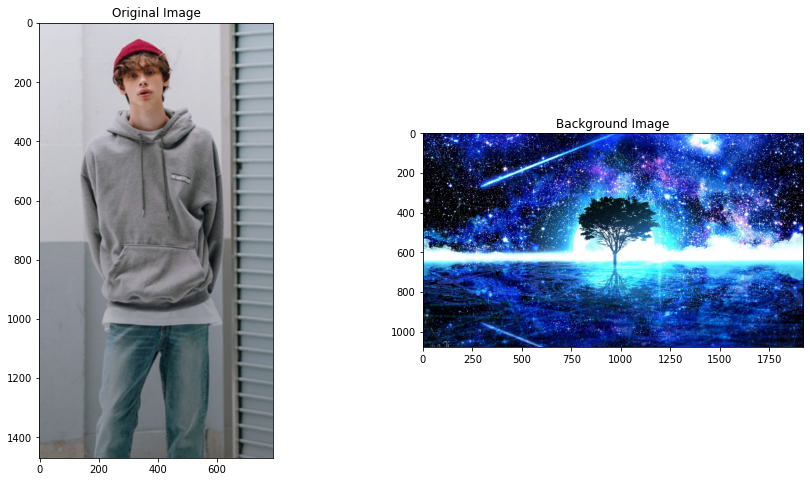

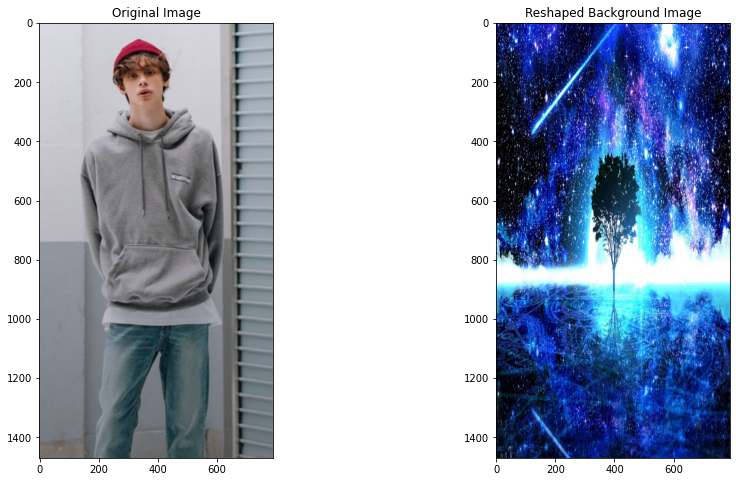

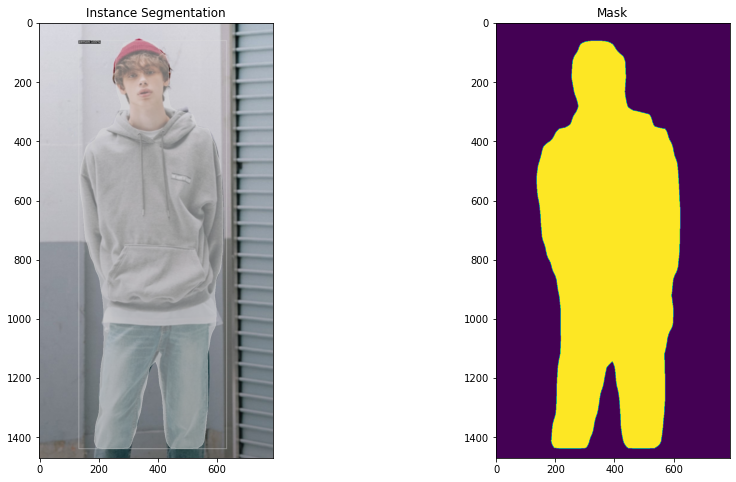

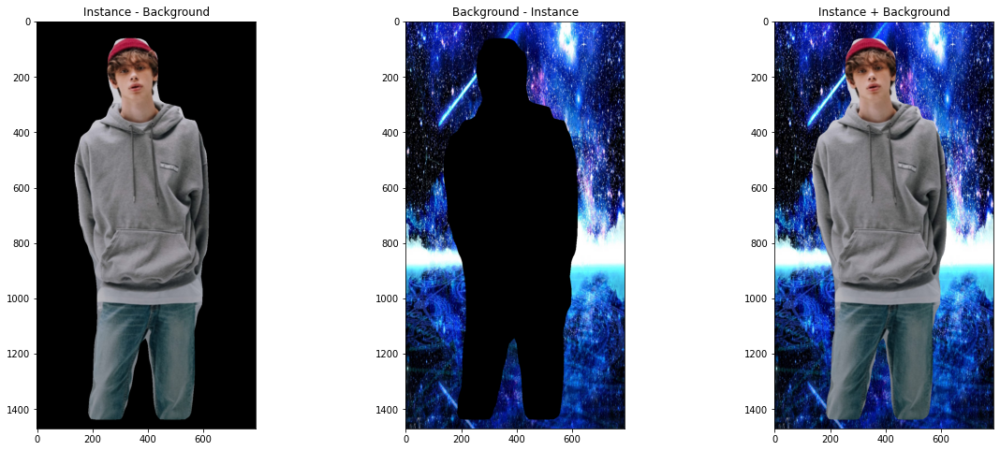

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/my_image.jpg'
background_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/bg1.jpg'

original_img = cv2.imread(original_img_path)
background_img = cv2.imread(background_img_path)

blend_background(original_img, background_img, model='mask_rcnn')

# 사람1 point rend

WARNING [06/09 02:56:22 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/content/detectron2_repo/projects/PointRend/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  point_coords[:, :, 1] = h_step / 2.0 + (point

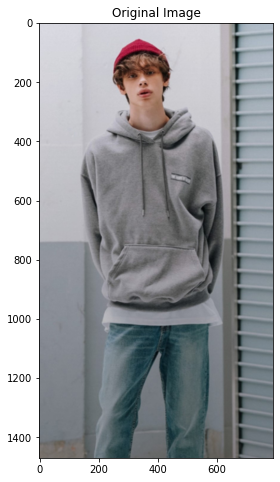

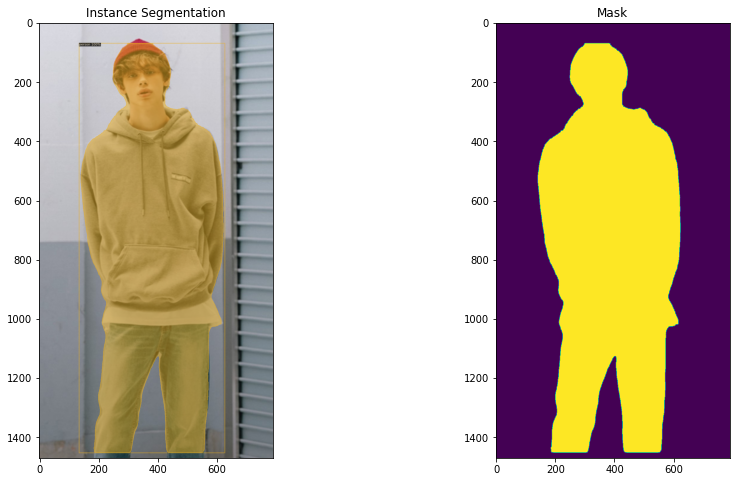

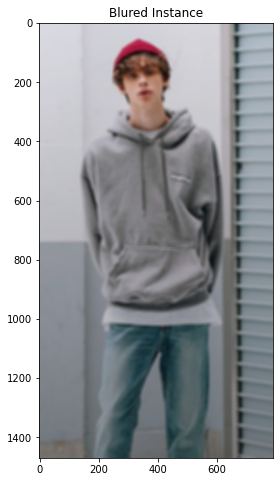

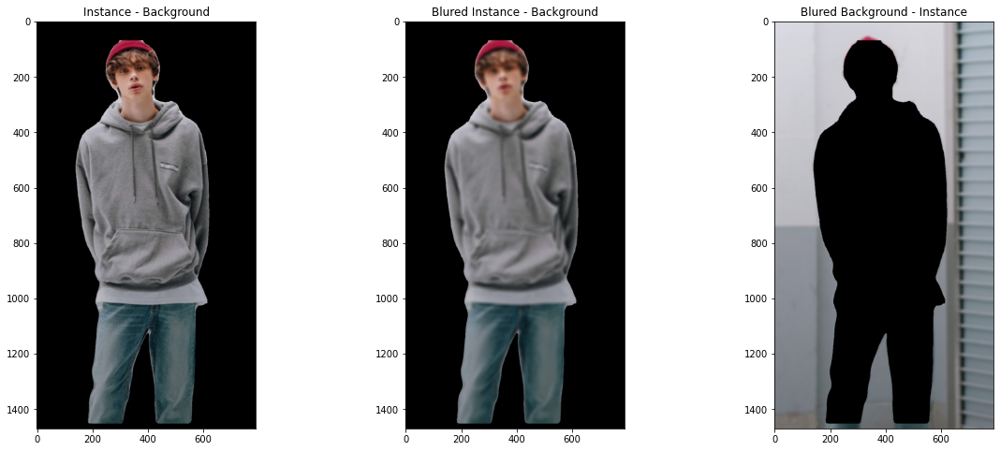

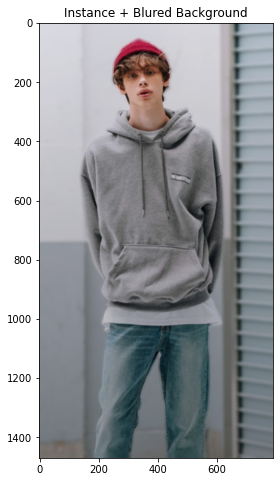

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/my_image.jpg'
original_img = cv2.imread(original_img_path)

blured_background(original_img, model='point_rend')

WARNING [06/09 02:56:26 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/content/detectron2_repo/projects/PointRend/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  point_coords[:, :, 1] = h_step / 2.0 + (point

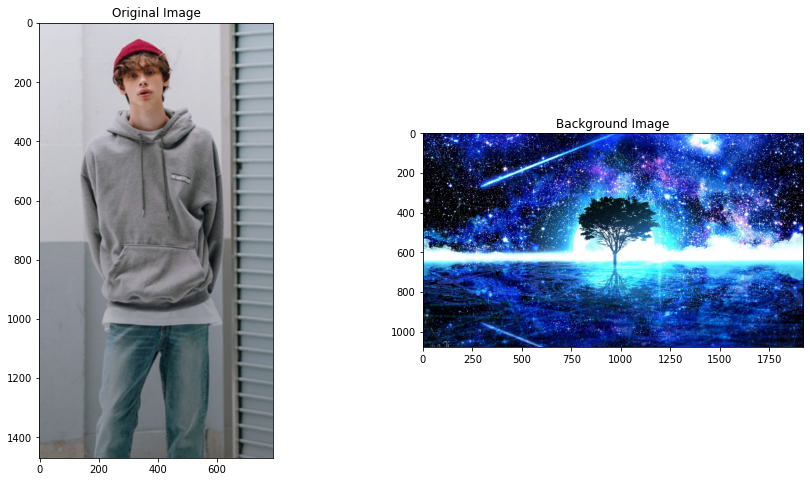

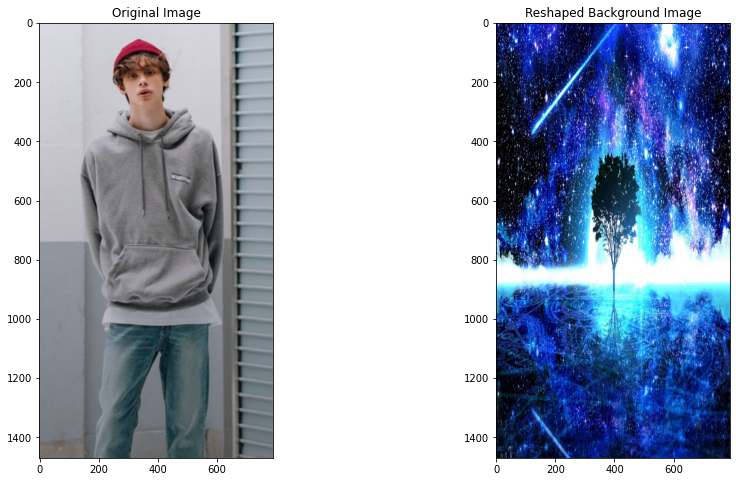

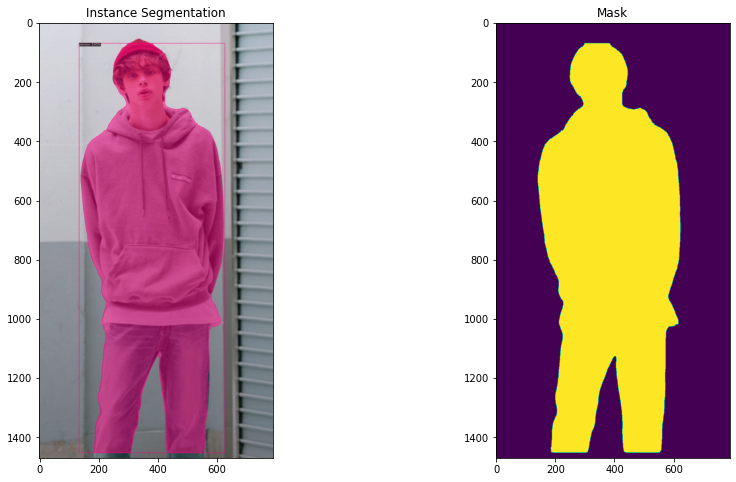

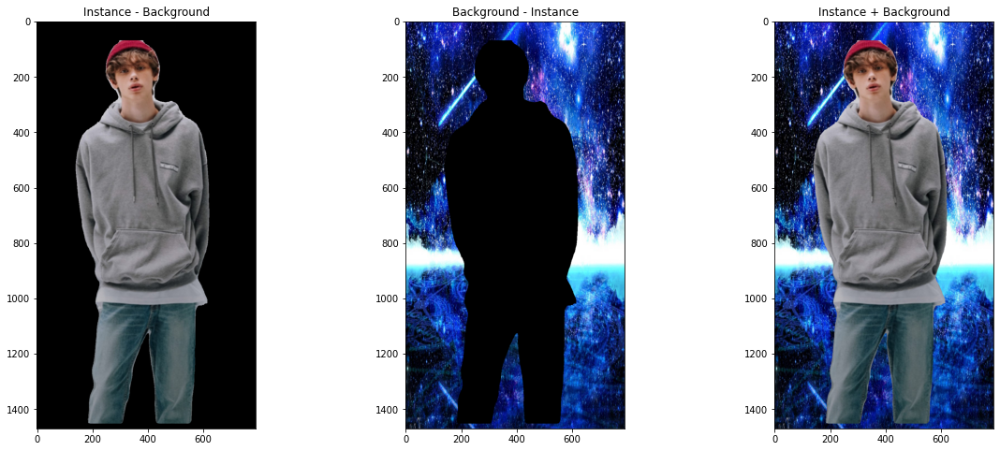

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/my_image.jpg'
background_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/bg1.jpg'

original_img = cv2.imread(original_img_path)
background_img = cv2.imread(background_img_path)

blend_background(original_img, background_img, model='point_rend')

# 사람2 mask rcnn

/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


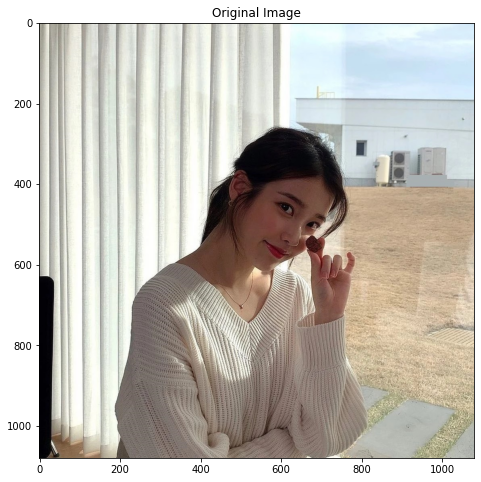

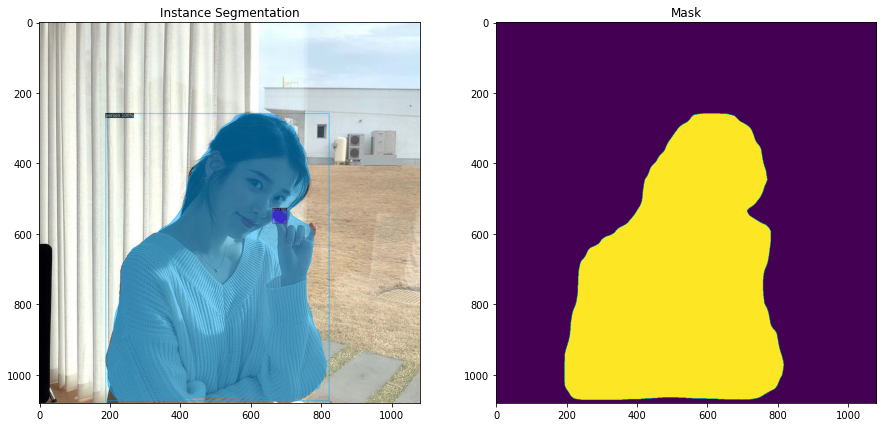

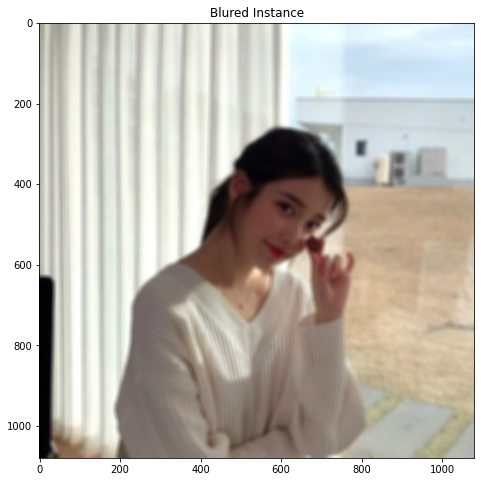

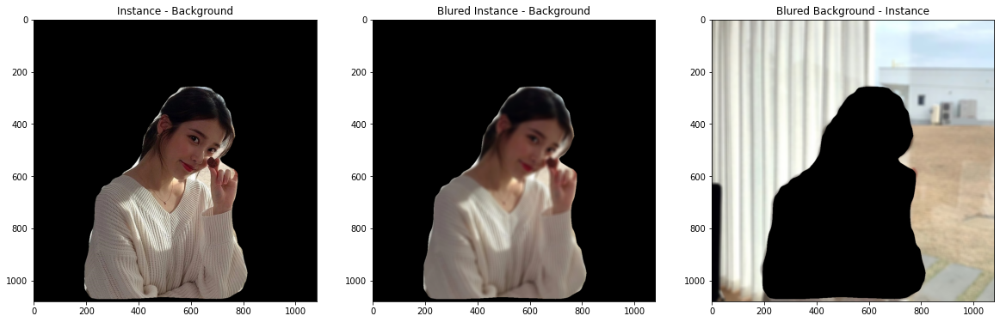

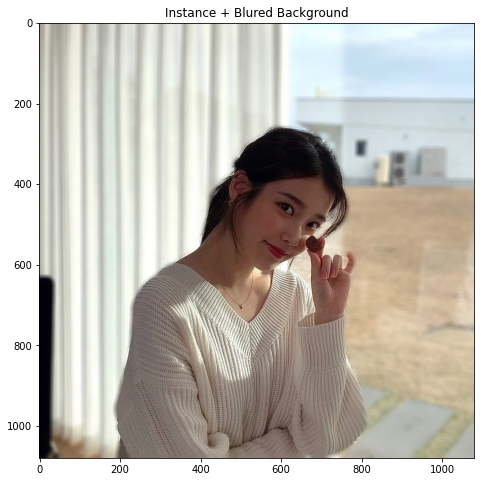

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image1.jpg'
original_img = cv2.imread(original_img_path)

blured_background(original_img, model='mask_rcnn')

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image1.jpg'
background_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/bg2.jpg'

original_img = cv2.imread(original_img_path)
background_img = cv2.imread(background_img_path)

blend_background(original_img, background_img, model='mask_rcnn')

Output hidden; open in https://colab.research.google.com to view.

# 사람2 point rend

WARNING [06/09 03:02:39 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/content/detectron2_repo/projects/PointRend/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  point_coords[:, :, 1] = h_step / 2.0 + (point

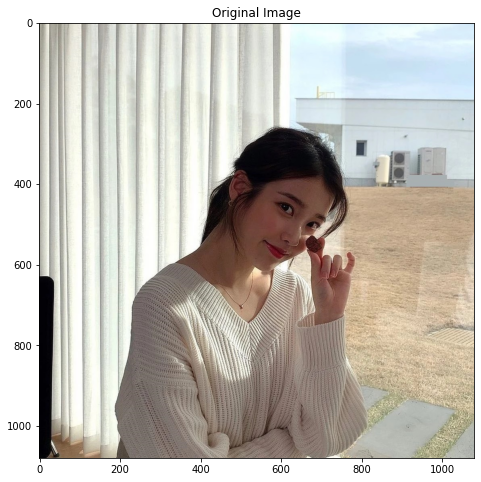

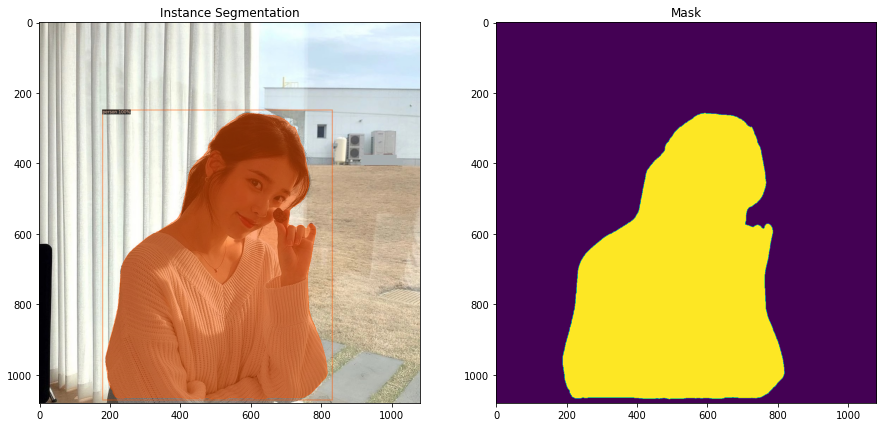

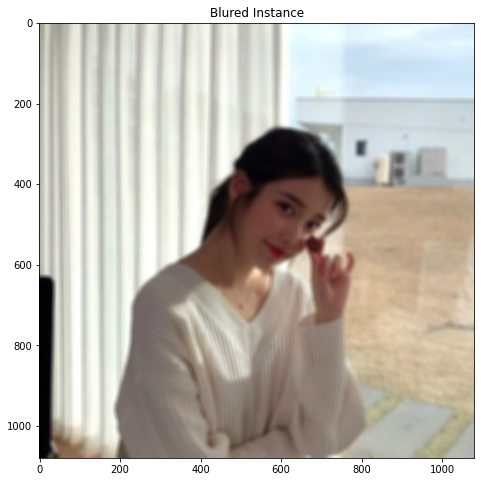

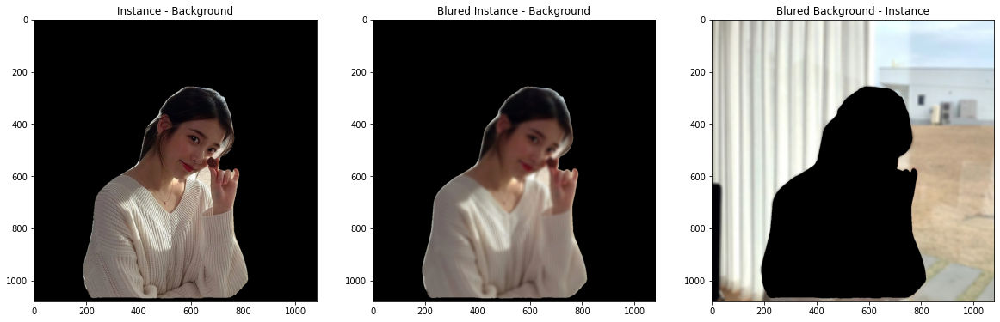

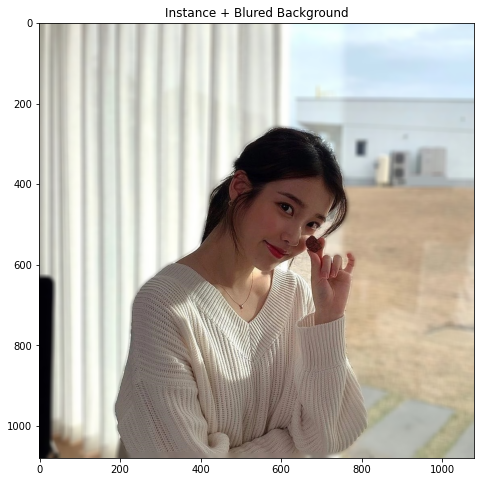

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image1.jpg'
original_img = cv2.imread(original_img_path)

blured_background(original_img, model='point_rend')

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image1.jpg'
background_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/bg2.jpg'

original_img = cv2.imread(original_img_path)
background_img = cv2.imread(background_img_path)

blend_background(original_img, background_img, model='point_rend')

Output hidden; open in https://colab.research.google.com to view.

# 고양이1 mask rcnn

/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


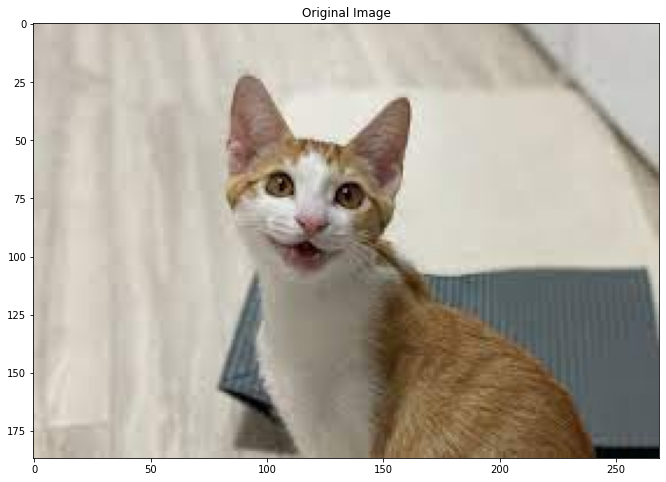

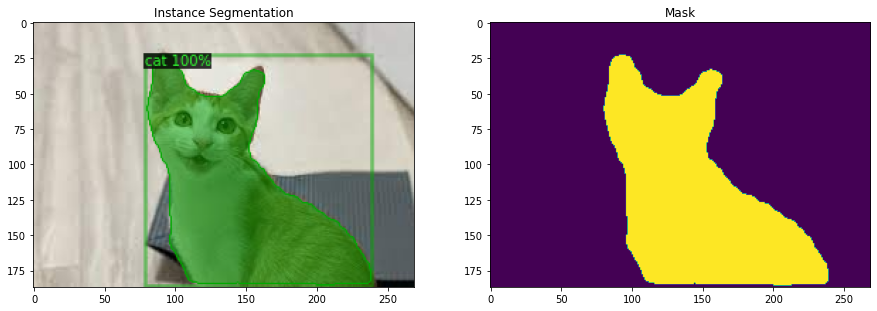

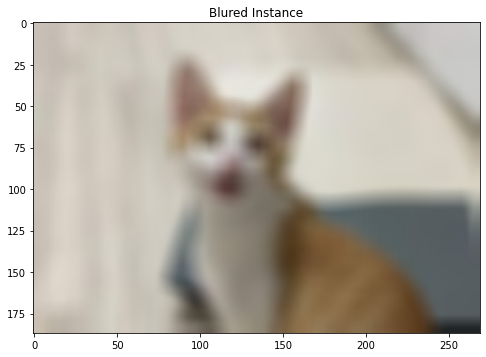

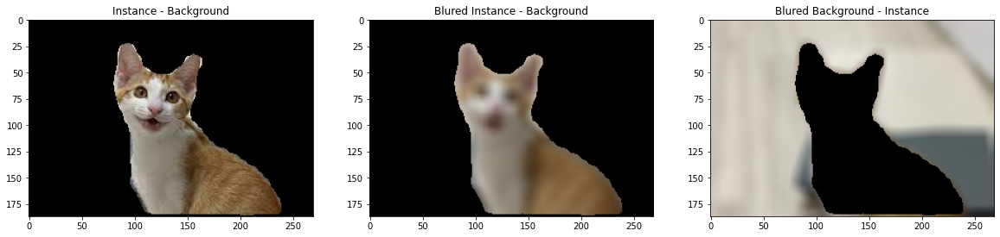

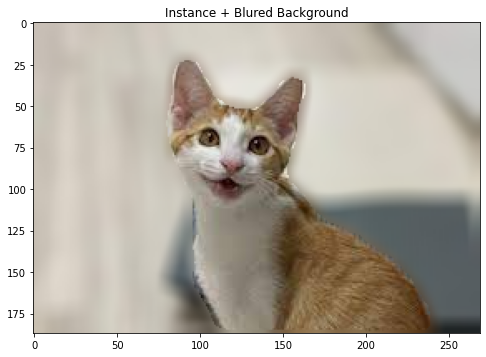

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image2.jpg'
original_img = cv2.imread(original_img_path)

blured_background(original_img, model='mask_rcnn')

/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


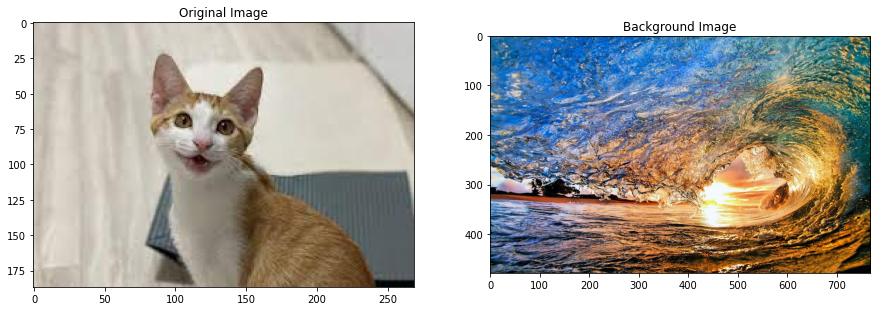

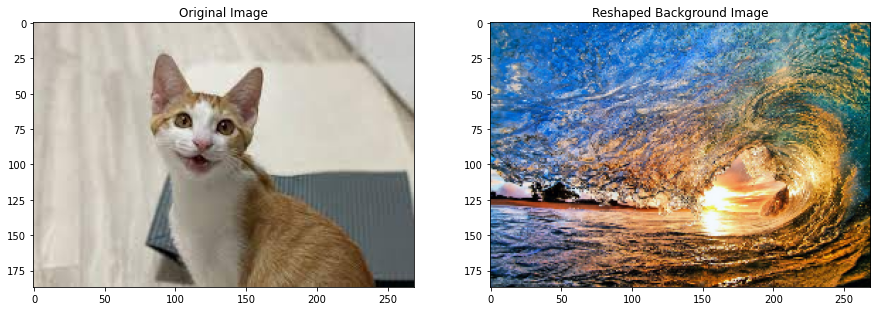

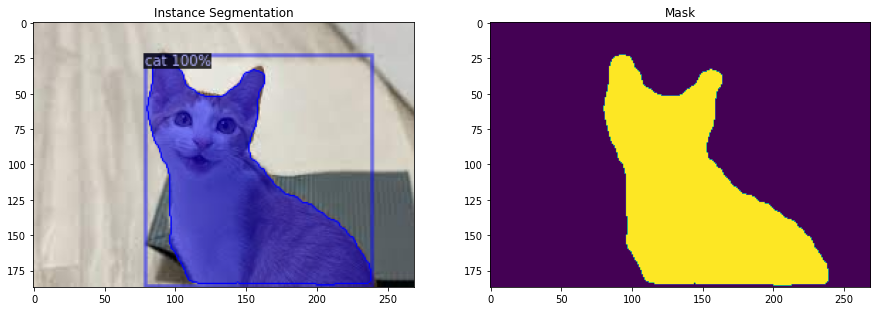

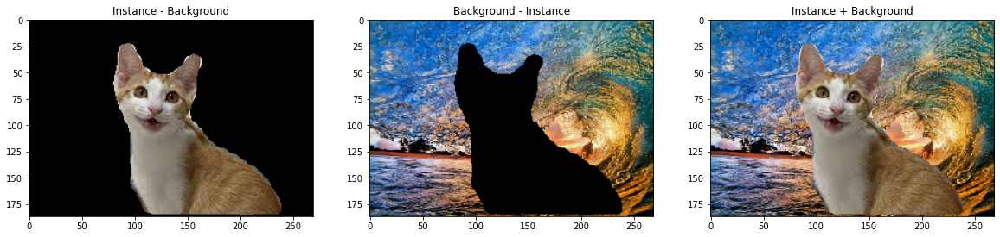

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image2.jpg'
background_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/bg3.jpg'

original_img = cv2.imread(original_img_path)
background_img = cv2.imread(background_img_path)

blend_background(original_img, background_img, model='mask_rcnn')

# 고양이1 point rend

WARNING [06/09 03:02:58 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/content/detectron2_repo/projects/PointRend/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  point_coords[:, :, 1] = h_step / 2.0 + (point

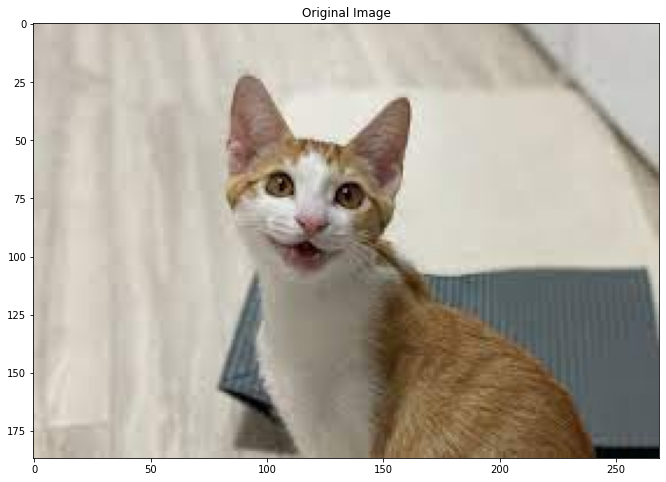

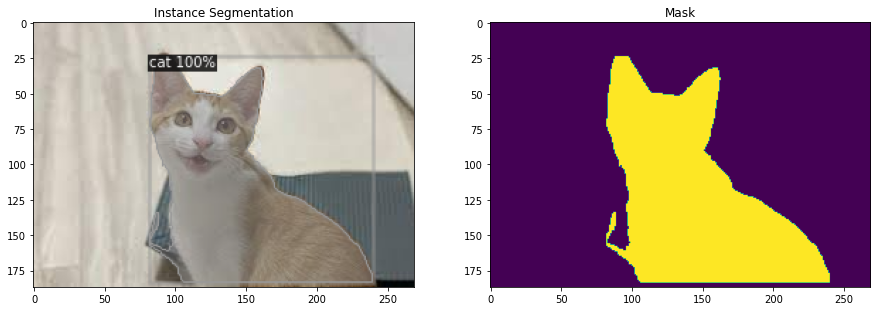

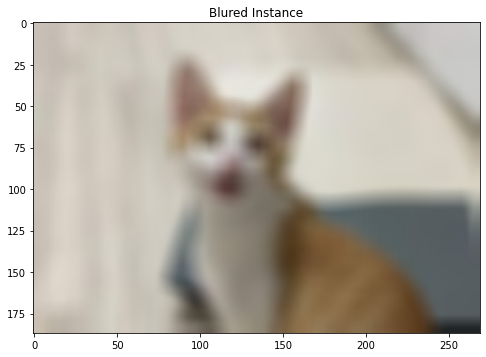

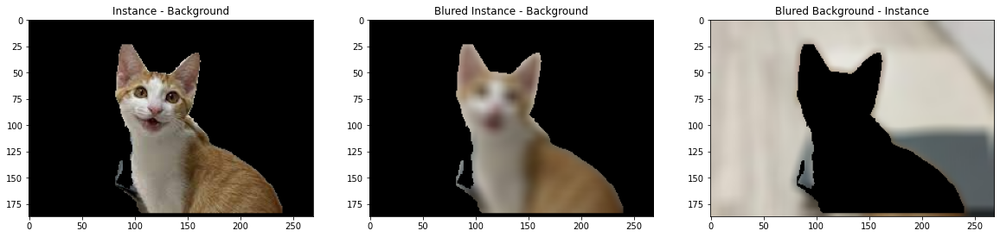

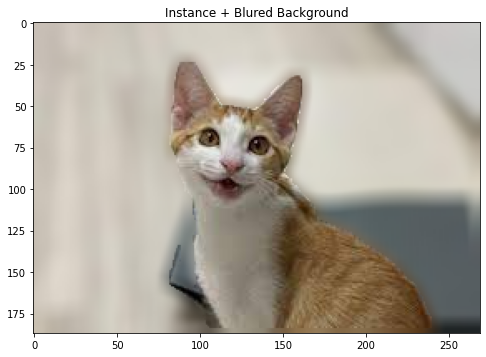

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image2.jpg'
original_img = cv2.imread(original_img_path)

blured_background(original_img, model='point_rend')

WARNING [06/09 03:03:01 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/content/detectron2_repo/projects/PointRend/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  point_coords[:, :, 1] = h_step / 2.0 + (point

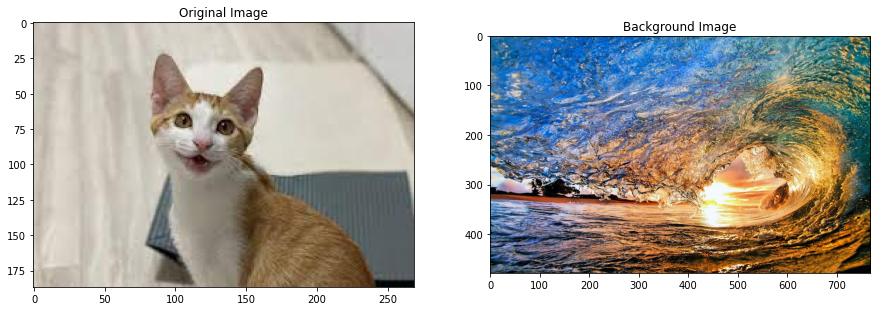

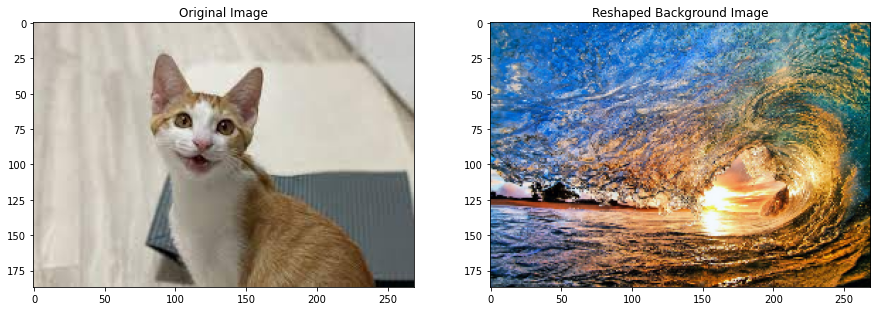

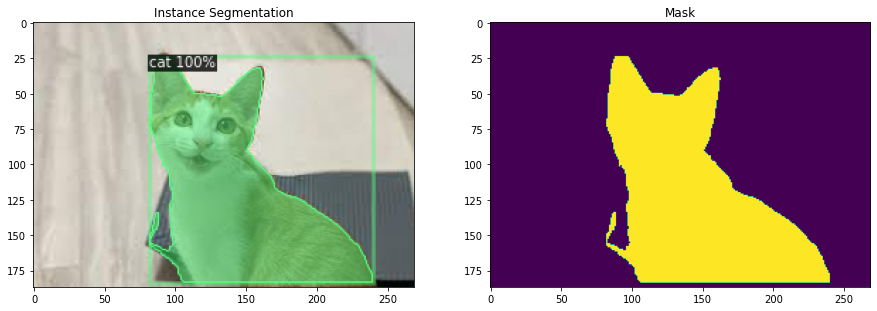

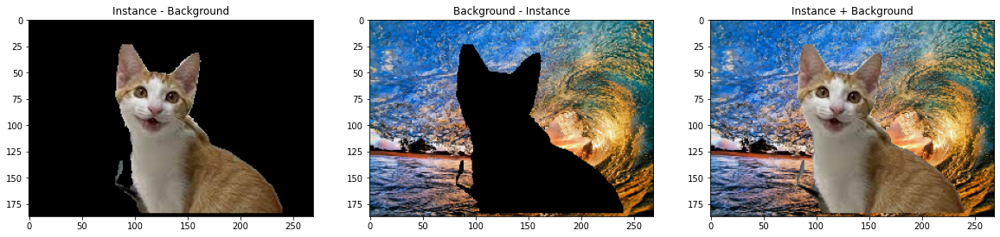

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image2.jpg'
background_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/bg3.jpg'

original_img = cv2.imread(original_img_path)
background_img = cv2.imread(background_img_path)

blend_background(original_img, background_img, model='point_rend')

# 고양이2 mask rcnn

/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


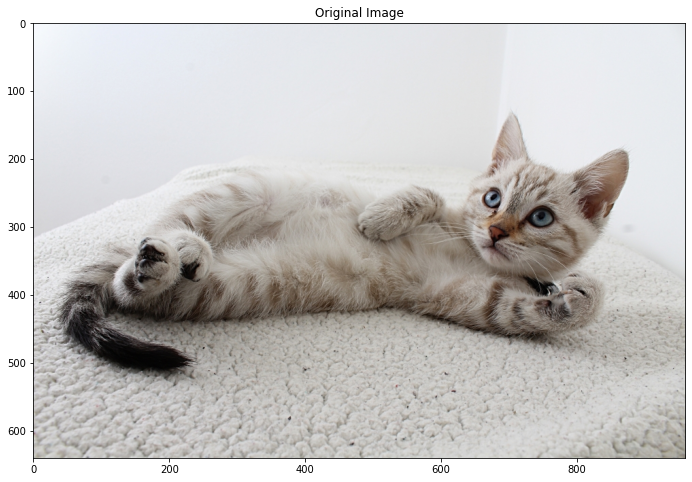

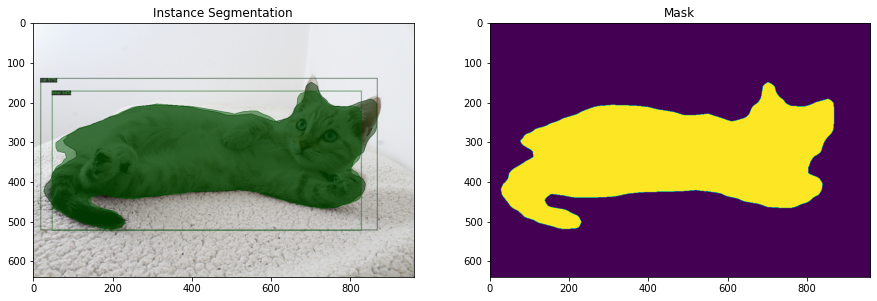

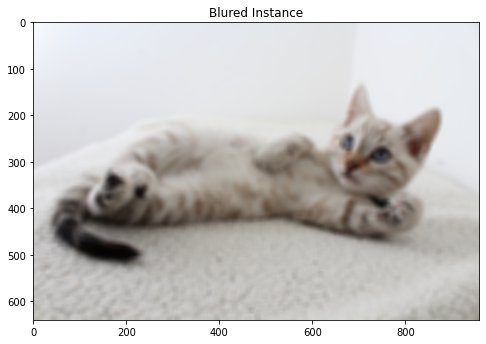

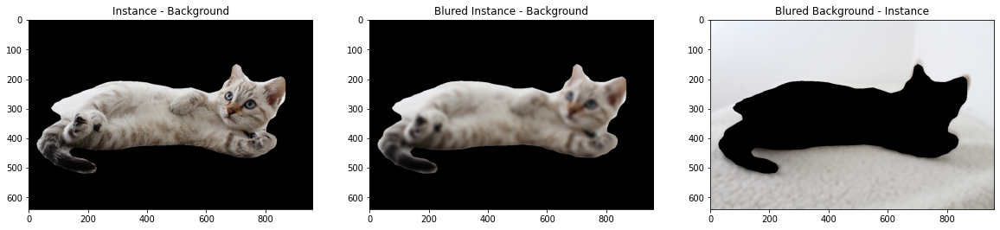

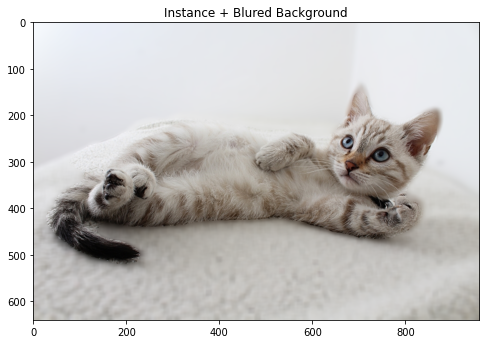

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image3.jpg'
original_img = cv2.imread(original_img_path)

blured_background(original_img, model='mask_rcnn')

/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


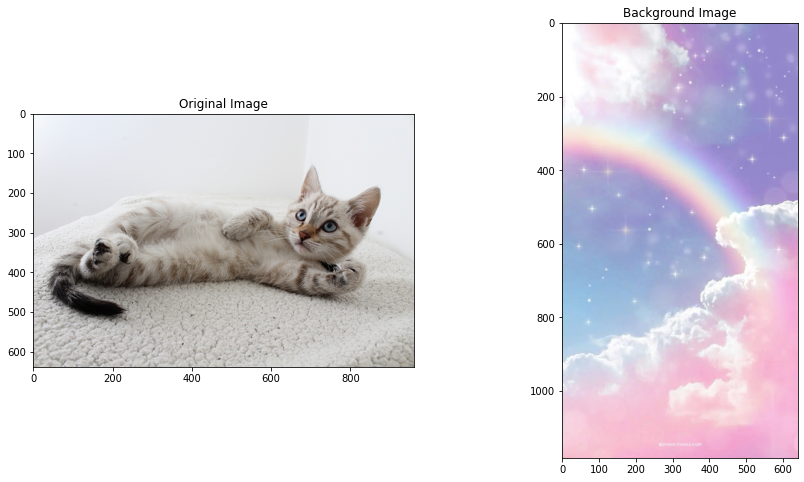

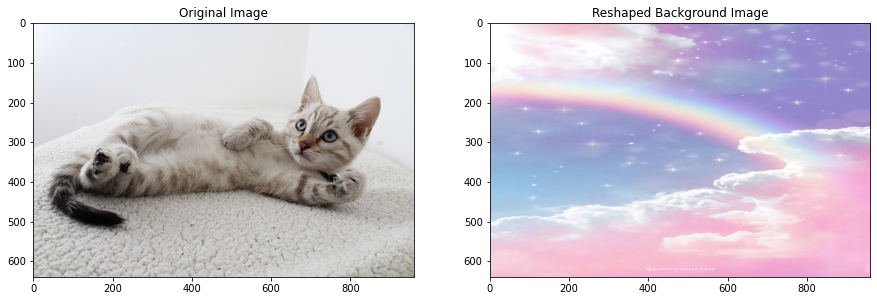

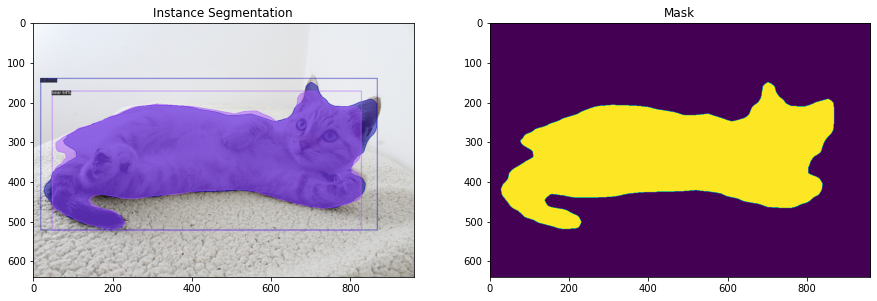

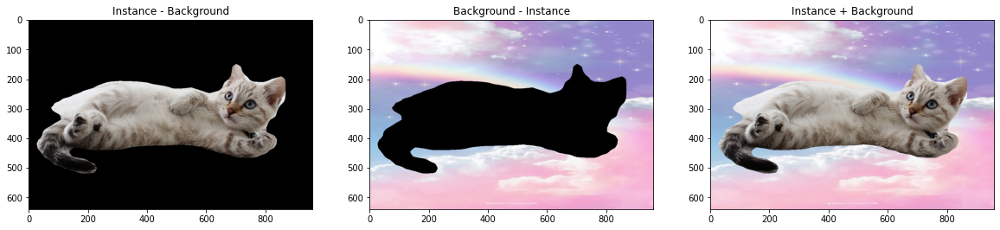

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image3.jpg'
background_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/bg4.jpg'

original_img = cv2.imread(original_img_path)
background_img = cv2.imread(background_img_path)

blend_background(original_img, background_img, model='mask_rcnn')

# 고양이2 point rend

WARNING [06/09 03:03:15 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/content/detectron2_repo/projects/PointRend/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  point_coords[:, :, 1] = h_step / 2.0 + (point

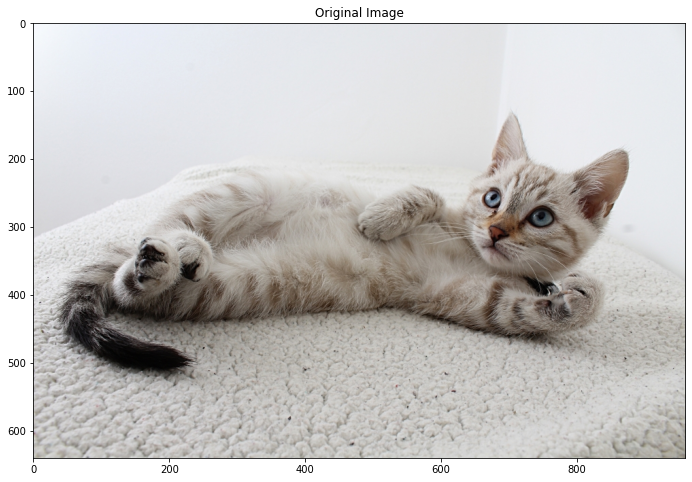

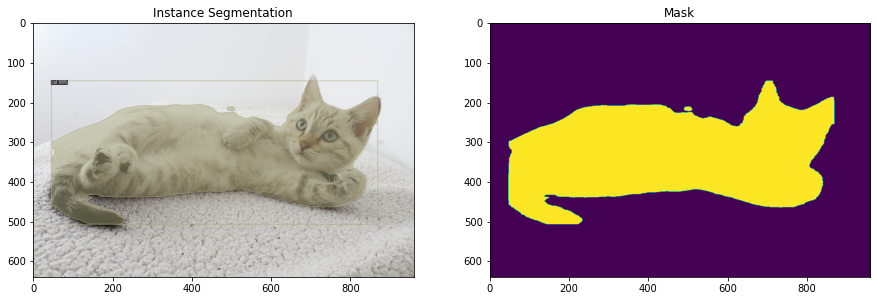

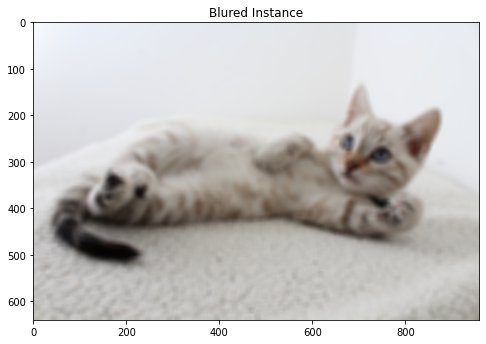

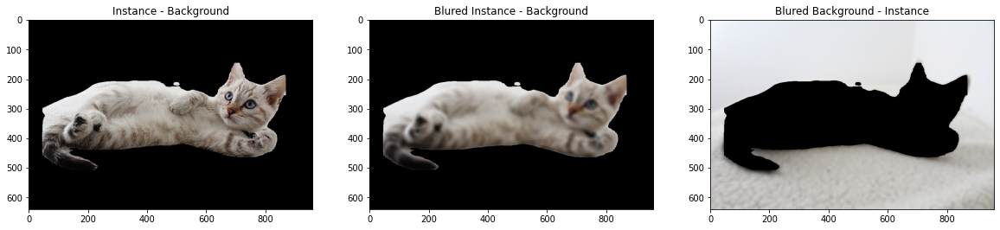

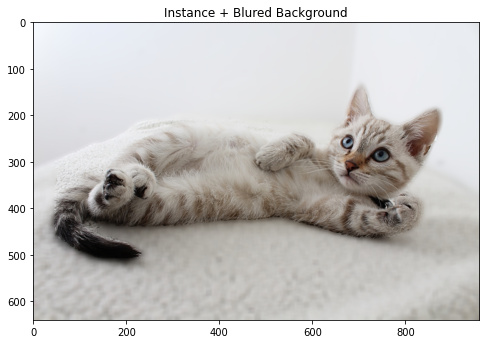

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image3.jpg'
original_img = cv2.imread(original_img_path)

blured_background(original_img, model='point_rend')

WARNING [06/09 03:03:19 d2.projects.point_rend.mask_head]: Weight format of PointRend models have changed! Applying automatic conversion now ...


/content/detectron2_repo/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/content/detectron2_repo/projects/PointRend/point_rend/point_features.py:142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  point_coords[:, :, 1] = h_step / 2.0 + (point

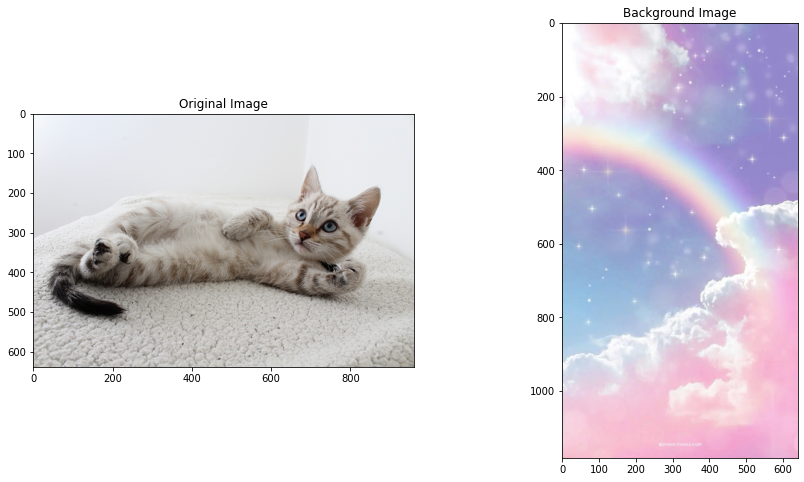

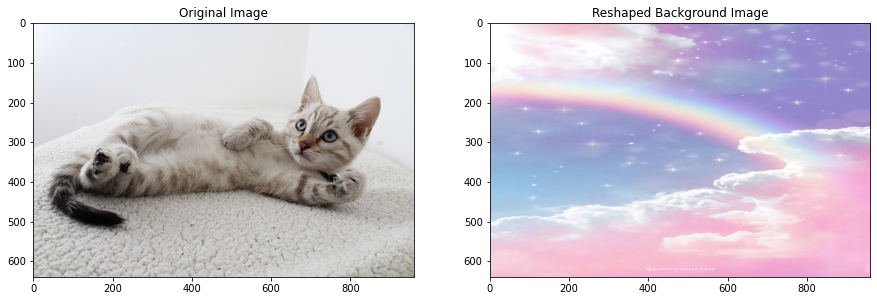

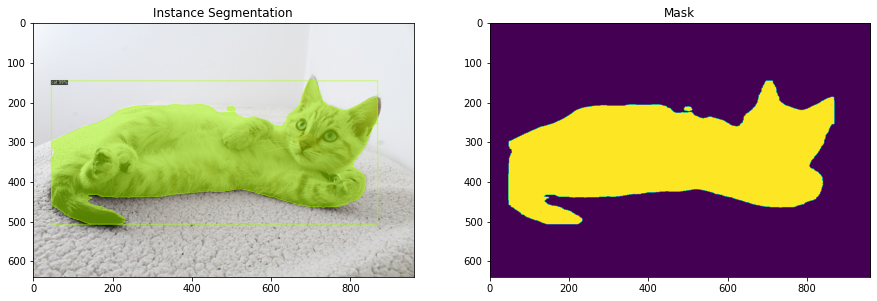

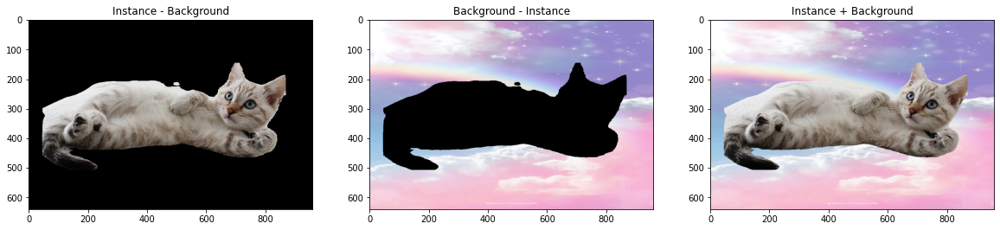

In [ ]:
original_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/image3.jpg'
background_img_path = '/gdrive/MyDrive/0. 인공지능 학습/아이펠 대전 3기/2. Exploration 수업/코드/10강/bg4.jpg'

original_img = cv2.imread(original_img_path)
background_img = cv2.imread(background_img_path)

blend_background(original_img, background_img, model='point_rend')

# 문제점 분석
https://drive.google.com/file/d/1F0bNs5M_Aeg1bmX8cVLvShnZkXmBkWSu/view?usp=sharing
<img src='https://drive.google.com/uc?export=download&id=1F0bNs5M_Aeg1bmX8cVLvShnZkXmBkWSu' width="" height ="" /><br>

# 해법 제시
https://drive.google.com/file/d/1F5w1rQXvkd51RqTUb77LHhWc4Sugu5-H/view?usp=sharing
<img src='https://drive.google.com/uc?export=download&id=1F5w1rQXvkd51RqTUb77LHhWc4Sugu5-H' width="" height ="" /><br>

- 기존의 segmentation 기법은 이미지를 업샘플링하는 과정에서 이미지의 경계면이 뭉개지는 현상이 존재했음.
- 따라서 이미지 분류 결과 손가락이나 머리카락 등 세부적으로 표현되는 이미지의 경계에서 정확도가 떨어짐.
- pointrend 기법은 업샘플링을 이미지의 분포에 맞춰 샘플링 밀도를 조정해줌으로써 이미지의 가장자리까지 정확하게 표현하는 것이 가능함.
- 위의 과정에서 mask rcnn과 pointrend를 비교함으로써 각 모델의 instance segmentation의 문제점/정확도/개선사항 등을 나타내었음.

In [22]:
# 마크다운 링크 생성
url="https://drive.google.com/file/d/1F5w1rQXvkd51RqTUb77LHhWc4Sugu5-H/view?usp=sharing" #link 부분을 구글 드라이브에서 생성한 공유 링크로 변경해주면 된다.
path='https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
size="width=\"\" "+"height =\"\" "
tag="<img src='"+path+"' "+size+"/><br>"
print(" ▶ Path : ", path)
print('\n',"▶ Tag : ", tag)

 ▶ Path :  https://drive.google.com/uc?export=download&id=1F5w1rQXvkd51RqTUb77LHhWc4Sugu5-H

 ▶ Tag :  <img src='https://drive.google.com/uc?export=download&id=1F5w1rQXvkd51RqTUb77LHhWc4Sugu5-H' width="" height ="" /><br>
